In [1]:
import sys

sys.path.append("../../")

import importlib, NB_config

importlib.reload(NB_config)
from NB_config import *

In [2]:
df = pd.read_csv(DATASET_PATH, low_memory=False)
cities = pd.read_csv(CITIES_META_PATH, low_memory=False)

In [3]:
def clean_city_name(city):
    if pd.isna(city):
        return city
    return city.split(",")[0].strip()


df["city_clean"] = df["city"].str.split(",").str[0].str.strip().str.lower()

cities["city_clean"] = cities["city"].str.split(",").str[0].str.strip().str.lower()

In [4]:
df_geo = df.merge(cities, on="city_clean", how="left")

In [5]:
df_geo[["city_clean", "country", "population"]].isna().sum()

city_clean        0
country           0
population    10761
dtype: int64

In [6]:
missing_cities = df_geo[df_geo["population"].isna()]["city_clean"].unique()
len(missing_cities)

4

In [7]:
missing_cities[:20]

array(['seville', 'cancun', 'kyoto', 'bali'], dtype=object)

In [8]:
missing_ratio = df_geo["population"].isna().mean()
missing_ratio

np.float64(0.07198715590192996)

In [19]:
df_geo["population_missing"] = df_geo[
    "population"
].isna()  # Created a new column to indicate missing population values useful for modelling
print(df_geo["population_missing"].value_counts())

population_missing
False    138724
True      10761
Name: count, dtype: int64


In [10]:
df_geo["continent_x"] = df_geo["continent_x"].fillna("Unknown")

In [11]:
fig = px.scatter_geo(
    df_geo,
    lat="latitude_x",
    lon="longitude_x",
    color="entity_type",
    hover_name="name",
    title="Global Distribution of Entities",
)
fig.show()

Text(0.5, 1.0, 'Entities per Continent')

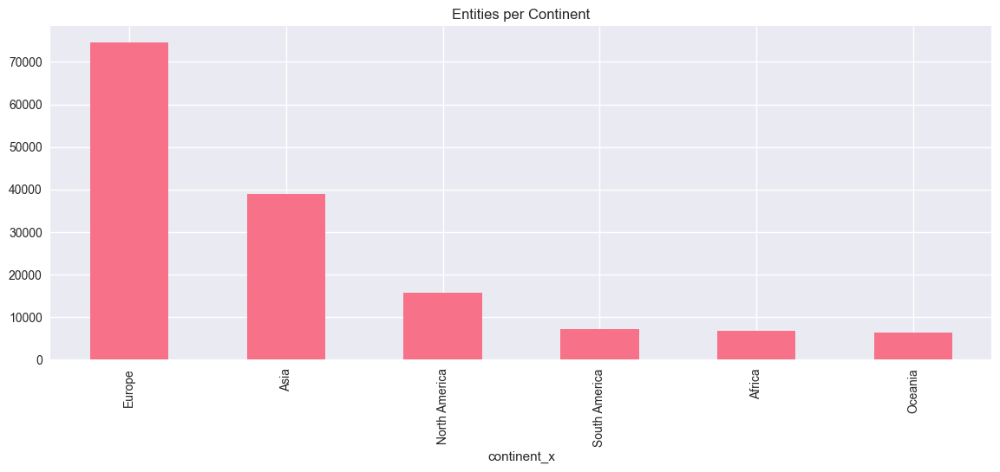

In [12]:
df_geo["continent_x"].value_counts().plot(kind="bar")
plt.title("Entities per Continent")

In [13]:
heat_data = df_geo[["latitude_x", "longitude_x"]].dropna().values.tolist()

m = folium.Map(location=[20, 0], zoom_start=2)
HeatMap(heat_data).add_to(m)
m

In [14]:
coords = df_geo[["latitude_x", "longitude_x"]].dropna()

scaler = StandardScaler()
coords_scaled = scaler.fit_transform(coords)

kmeans = KMeans(n_clusters=5, random_state=42)
df_geo.loc[coords.index, "cluster"] = kmeans.fit_predict(coords_scaled)

In [15]:
px.scatter_geo(
    df_geo,
    lat="latitude_x",
    lon="longitude_x",
    color="cluster",
    title="Geographical Clusters",
)

In [18]:
top_cities = df_geo["city_clean"].value_counts().head(10)
print(top_cities)

city_clean
london       10192
florence      8043
madrid        6700
milan         5816
munich        5732
barcelona     5198
bali          5124
rome          4622
seoul         4200
bangkok       3926
Name: count, dtype: int64


In [24]:
city_ratings = df_geo.groupby("city_clean")["stars"].mean().sort_values(ascending=False)
print(city_ratings.head(10))

city_clean
kyoto            4.087575
tokyo            4.067015
istanbul         4.041837
paris            4.033538
shanghai         4.031655
hong kong        4.028780
beijing          4.024233
new york         4.021010
copenhagen       4.020972
san francisco    4.019276
Name: stars, dtype: float64


In [26]:
print(df_geo.columns)

Index(['business_id', 'name', 'city_x', 'state_x', 'country', 'country_name',
       'continent_x', 'latitude_x', 'longitude_x', 'stars', 'review_count',
       'categories', 'attributes', 'hours', 'is_open', 'address',
       'price_level', 'description', 'website', 'phone', 'image_url', 'source',
       'entity_type', 'popularity', 'city_clean', 'city_y', 'country_code',
       'continent_y', 'state_y', 'latitude_y', 'longitude_y', 'avg_temp_jan_c',
       'avg_temp_jul_c', 'annual_rainfall_mm', 'population',
       'population_missing', 'cluster'],
      dtype='str')


In [27]:
df_geo.groupby("continent_x")["stars"].agg(["mean", "count"])

,mean,count
continent_x,,
Africa,3.999558,6780
Asia,4.014479,38924
Europe,4.005558,74672
North America,4.010974,15673
Oceania,4.000000,6345
South America,3.999690,7091


In [34]:
df_geo["mean_temperature"] = df_geo[["avg_temp_jul_c", "avg_temp_jan_c"]].mean(axis=1)

<Axes: xlabel='mean_temperature', ylabel='stars'>

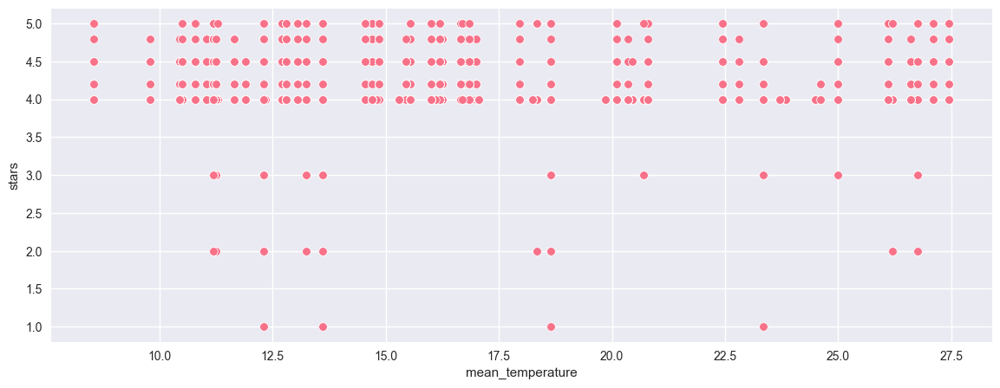

In [39]:
sns.scatterplot(
    data=df_geo,
    x="mean_temperature",
    y="stars",
)

([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Asia'),
  Text(1, 0, 'Europe'),
  Text(2, 0, 'North America'),
  Text(3, 0, 'South America'),
  Text(4, 0, 'Oceania'),
  Text(5, 0, 'Africa')])

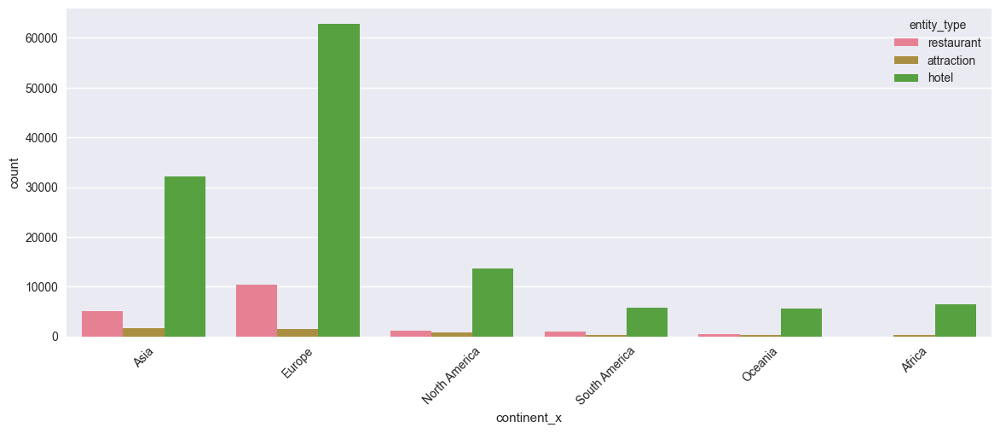

In [41]:
sns.countplot(data=df_geo, x="continent_x", hue="entity_type")
plt.xticks(rotation=45)